In [829]:
#All dependencies in the dependencies.txt file. This should work too
#!pip install numpy pandas IPython seaborn matplotlib folium statsmodels tensorflow scikit-learn

In [31]:
# DATA 
import numpy as np
import pandas as pd

# DASHBOARDS
from IPython.display import HTML

# PLOTTERS
import seaborn as sns
import matplotlib.pyplot as plt

# MAP VISUALIZER
import folium
from folium.plugins import MarkerCluster


# STATISTICS
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# LSTM
import tensorflow as tf
import tensorflow.keras as keras
from tensorflow.keras.layers import Input, Bidirectional, LSTM, Dense
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split

# BASIC Exploratory Data Analysis (EDA)

<center> <h2>First Look at The Data </h2></center>

In [32]:
data = pd.read_csv("orders_autumn_2020.csv")
print(data.dtypes)
data.describe()

TIMESTAMP                                                object
ACTUAL_DELIVERY_MINUTES - ESTIMATED_DELIVERY_MINUTES      int64
ITEM_COUNT                                                int64
USER_LAT                                                float64
USER_LONG                                               float64
VENUE_LAT                                               float64
VENUE_LONG                                              float64
ESTIMATED_DELIVERY_MINUTES                                int64
ACTUAL_DELIVERY_MINUTES                                   int64
CLOUD_COVERAGE                                          float64
TEMPERATURE                                             float64
WIND_SPEED                                              float64
PRECIPITATION                                           float64
dtype: object


,ACTUAL_DELIVERY_MINUTES - ESTIMATED_DELIVERY_MINUTES,ITEM_COUNT,USER_LAT,USER_LONG,VENUE_LAT,VENUE_LONG,ESTIMATED_DELIVERY_MINUTES,ACTUAL_DELIVERY_MINUTES,CLOUD_COVERAGE,TEMPERATURE,WIND_SPEED,PRECIPITATION
count,18706.000000,18706.000000,18706.000000,18706.000000,18706.000000,18706.000000,18706.000000,18706.000000,18429.000000,18429.000000,18429.000000,18706.000000
mean,-1.201058,2.688228,60.175234,24.941244,60.175643,24.941214,33.809313,32.608254,11.996853,16.973536,3.790991,0.332756
std,8.979834,1.886455,0.012674,0.016540,0.011509,0.014482,7.340283,10.018879,23.812605,3.411900,1.456017,1.129234
min,-41.000000,1.000000,60.153000,24.909000,60.149000,24.878000,10.000000,6.000000,0.000000,6.100000,0.077419,0.000000
25%,-7.000000,1.000000,60.163000,24.926000,60.167000,24.930000,28.000000,25.000000,0.000000,14.400000,2.696190,0.000000
50%,-2.000000,2.000000,60.175000,24.943000,60.170000,24.941000,33.000000,32.000000,0.000000,16.700000,3.631970,0.000000
75%,5.000000,4.000000,60.186000,24.954000,60.186000,24.950000,38.000000,40.000000,25.000000,18.900000,4.692530,0.000000
max,34.000000,11.000000,60.201000,24.980000,60.219000,25.042000,82.000000,58.000000,100.000000,26.700000,9.857300,6.315790


<center> <h2>Spatial View</h2></center>

---

1. We have **coordinates**. We can **visualize the area** where the users and venues are located
2. Plotting users and venues locations we find the dataset concerns the city of **Helsinki**
3. It's hard to tell whether some areas are more populated than others in terms of users and venues. A heatmap could clarify better (below in the Advanced EDA).

---

In [60]:
# Create float columns for convenience, without losing the original ones

data['user_lat'] = pd.to_numeric(data['USER_LAT'])
data['user_lon'] = pd.to_numeric(data['USER_LONG'])
data['venue_lat'] = pd.to_numeric(data['VENUE_LAT'])
data['venue_lon'] = pd.to_numeric(data['VENUE_LONG'])

##### Venues

In [59]:
#import folium
#from folium.plugins import MarkerCluster


# Create a map centered at Helsinki (blue placeholder)
m = folium.Map(location=[60.1756, 24.9342], zoom_start=13)

# Define Venue Coordinates
coords = zip(data["venue_lat"], data["venue_lon"])

# Use MarkerCluster to group nearby markers
marker_cluster = MarkerCluster().add_to(m)

# Add points to the marker cluster
for coord in coords:
    folium.Marker(location=coord).add_to(marker_cluster)

# Display the map
m

##### Users

In [55]:
#import folium
#from folium.plugins import MarkerCluster


# Create a map centered at Helsinki (blue placeholder)
m = folium.Map(location=[60.1756, 24.9342], zoom_start=13)

# Define Venue Coordinates
coords = zip(data["user_lat"], data["user_lon"])

# Use MarkerCluster to group nearby markers
marker_cluster = MarkerCluster().add_to(m)

# Add points to the marker cluster
for coord in coords:
    folium.Marker(location=coord).add_to(marker_cluster)

# Display the map
m

<center> <h2>Distributions</h2></center>

---

Three variables carry information about **orders' delivery time**

1. "ACTUAL_DELIVERY_MINUTES"
2. "ESTIMATED_DELIVERY_MINUTES",
3. "ACTUAL_DELIVERY_MINUTES - ESTIMATED_DELIVERY_MINUTES"

We can look at their single **distributions** (diagonal). Are they **gaussians**? Are they **skewed**?

What's the relation between each variable and the others (scatterplots and kdeplot, off-diagonal)

---

We don't see anything particularly surprising. The **(Actual - Estimated Delivery Minutes) variable is gaussian** and **centered below the 0**. Times are calculated so that **the user doesn't experience delays, on average.**

---

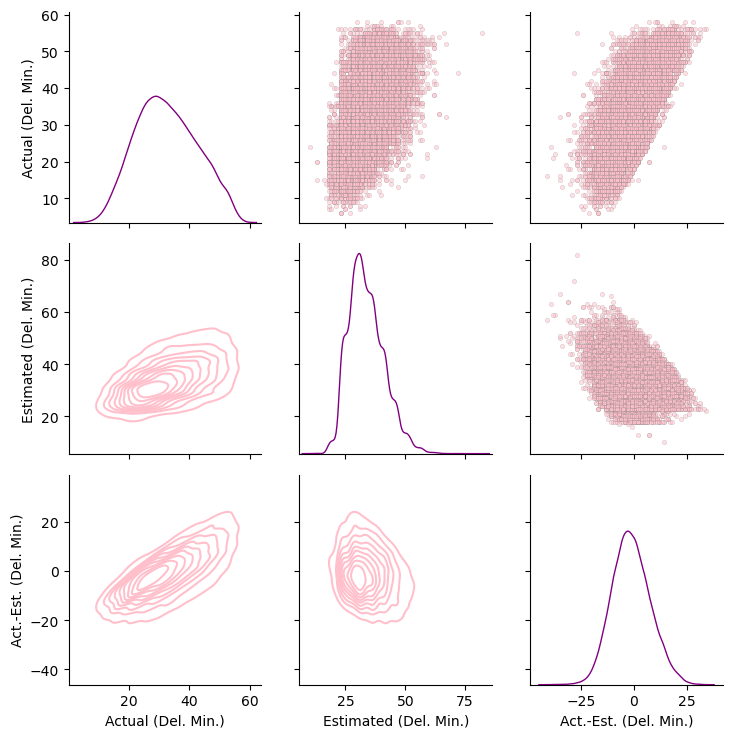

In [111]:
# import seaborn as sns
sub_data = data[["ACTUAL_DELIVERY_MINUTES",
                 "ESTIMATED_DELIVERY_MINUTES",
                 "ACTUAL_DELIVERY_MINUTES - ESTIMATED_DELIVERY_MINUTES"]]
sub_data.columns = ["Actual (Del. Min.)", "Estimated (Del. Min.)", "Act.-Est. (Del. Min.)"]
g = sns.PairGrid(sub_data)
g.map_upper(sns.scatterplot,alpha=0.5, s=10, edgecolor='grey', color = 'pink')
g.map_lower(sns.kdeplot, color = 'pink')
g.map_diag(sns.kdeplot, lw=1, legend=False, color = 'purple')
plt.show()

In [114]:
sub_data.describe()

,Actual (Del. Min.),Estimated (Del. Min.),Act.-Est. (Del. Min.)
count,18706.000000,18706.000000,18706.000000
mean,32.608254,33.809313,-1.201058
std,10.018879,7.340283,8.979834
min,6.000000,10.000000,-41.000000
25%,25.000000,28.000000,-7.000000
50%,32.000000,33.000000,-2.000000
75%,40.000000,38.000000,5.000000
max,58.000000,82.000000,34.000000


<center> <h2>Time Series</h2></center>

---
We can look for interesting **patterns** across time. Should we focus on **weekly/daily/hourly trends**?

Some **variables** with interesting behaviours could be:

---

1. **(Actual - Estimated) Delivery Minutes (Delay)**
- Do delays happen more often in certain weekdays/hours of day/day of month?
- What's the time series like for the total window of time in the data? Are there patterns we can predict?

---


2. **Number of Orders**
- How does the number of orders depend on weekdays/hours of day/day of month?
- What's the time series like for the total window of time in the data? Are there patterns we can predict?

---

3. **Other**
- Should we expect any relation between time and coordinates or user-venue distance?
---

In [244]:
# Convert into datetime format
data["Datetime"] = pd.to_datetime(data["TIMESTAMP"])

# Define new dataframe, for convenience
time_df = pd.DataFrame({})
time_df["date"] = data["Datetime"]
time_df["minute"] = data["Datetime"].dt.minute
time_df["hour"] = data["Datetime"].dt.hour
time_df["day"] = data["Datetime"].dt.day
time_df["month"] = data["Datetime"].dt.month
time_df["year"] = data["Datetime"].dt.year


time_df["Delay"] = data["ACTUAL_DELIVERY_MINUTES - ESTIMATED_DELIVERY_MINUTES"]
time_df["Counts"] = len(time_df)*[1]

time_df

,date,minute,hour,day,month,year,Delay,Counts
0,2020-08-01 06:07:00,7,6,1,8,2020,-19,1
1,2020-08-01 06:17:00,17,6,1,8,2020,-7,1
2,2020-08-01 06:54:00,54,6,1,8,2020,-17,1
3,2020-08-01 07:09:00,9,7,1,8,2020,-2,1
4,2020-08-01 07:10:00,10,7,1,8,2020,-1,1
...,...,...,...,...,...,...,...,...
18701,2020-09-30 19:27:00,27,19,30,9,2020,-1,1
18702,2020-09-30 19:36:00,36,19,30,9,2020,-8,1
18703,2020-09-30 19:39:00,39,19,30,9,2020,-14,1
18704,2020-09-30 19:42:00,42,19,30,9,2020,-11,1


##### Delays

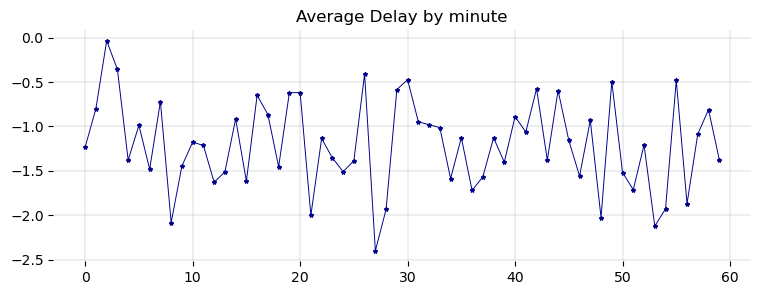

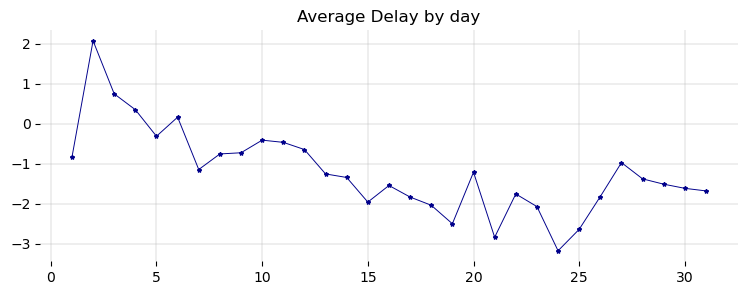

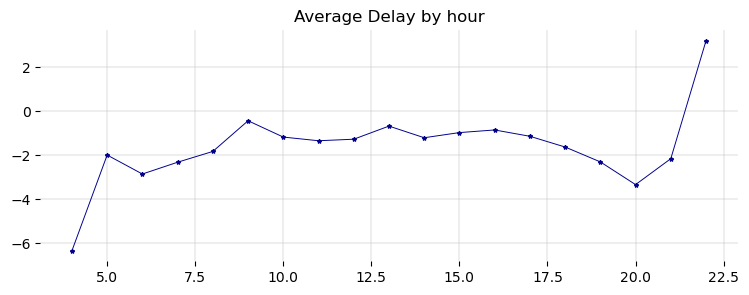

In [245]:
def time_series_plotter(granularity = 'day'):
    result_df = time_df.groupby([granularity]).agg({'Delay': 'mean'}).reset_index()
    plt.figure(figsize = (9,3))
    plt.plot(result_df[[granularity]], result_df["Delay"],  linewidth = 0.69, color = 'darkblue',
             marker = '*', markersize = 3.1)
    plt.title(f"Average Delay by {granularity}")
    plt.grid(True, linewidth = 0.3)
    plt.box(False)
    plt.show()

def time_series_plotter_counts(granularity = 'day'):
    result_df = time_df.groupby([granularity]).agg({'Counts': 'sum'}).reset_index()
    plt.figure(figsize = (9,3))
    plt.plot(result_df[[granularity]], result_df["Counts"],  linewidth = 0.69, color = 'darkblue',
             marker = '*', markersize = 3.1)
    plt.title(f"Nr. of Orders by {granularity}")
    plt.grid(True, linewidth = 0.3)
    plt.box(False)
    plt.show()

time_series_plotter('minute')
time_series_plotter('day')
time_series_plotter('hour')

##### Orders

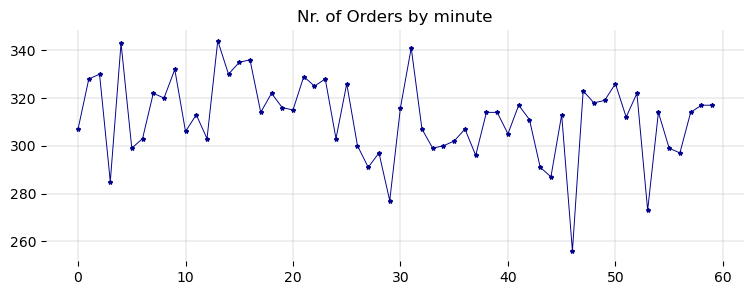

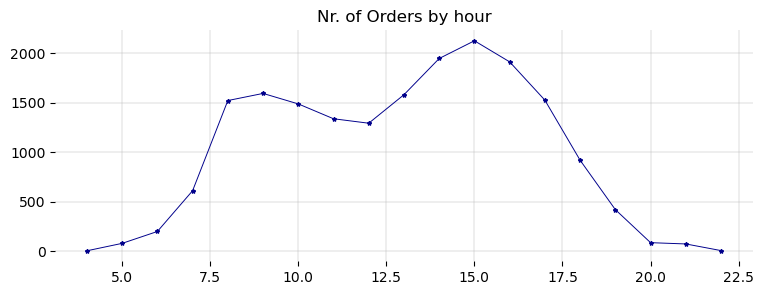

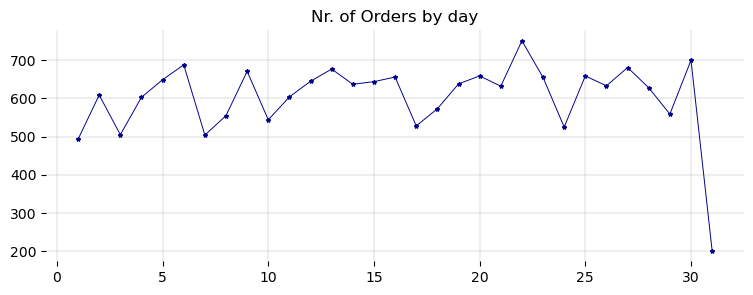

In [246]:
time_series_plotter_counts('minute')
time_series_plotter_counts('hour')
time_series_plotter_counts('day')

In [247]:
# This is needed for the resampling in the following plots. Set the "date" column as the index

time_df_n = time_df
time_df_n.set_index('date', inplace=True)

##### Delays

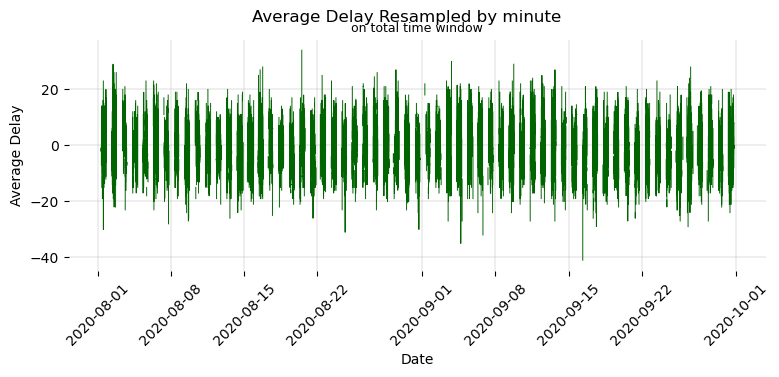

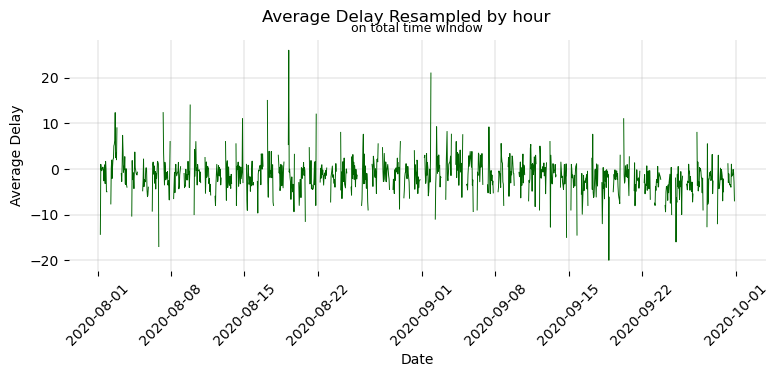

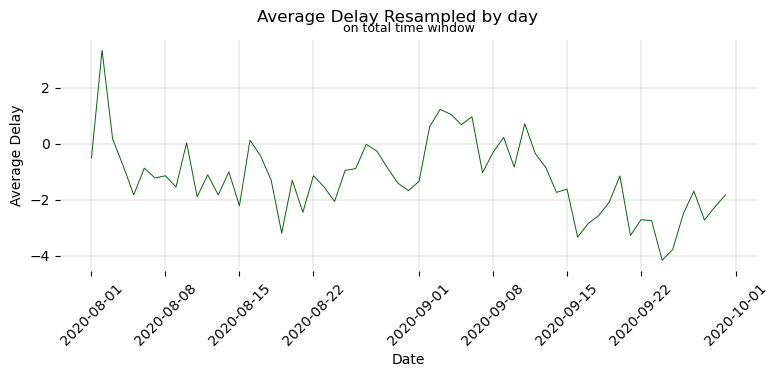

"\ntimeseries_plotter('minute', indicator = 'sum')\ntimeseries_plotter('hour', indicator = 'sum')\ntimeseries_plotter('day', indicator = 'sum')\n"

In [301]:
def timeseries_plotter(resampled_by = 'day', indicator = 'mean'):
    dictio = {'minute': 'T','hour': 'H',"day":'D', 'month':'M'}

    # Resample by day and calculate the mean delay for each day
    if indicator == 'mean':
        resampled_df = time_df_n.resample(dictio[resampled_by]).mean()
    elif indicator == 'sum':
        resampled_df = time_df_n.resample(dictio[resampled_by]).sum()
        

    plt.figure(figsize = (9,3))
    # Plot the resampled data
    plt.plot(resampled_df.index, resampled_df['Delay'], linewidth = 0.69, color = 'darkgreen')
    plt.xlabel('Date')
    plt.ylabel('Average Delay')
    plt.suptitle(f'Average Delay Resampled by {resampled_by}')
    plt.title('on total time window', fontsize = 9)
    plt.xticks(rotation = 45)
    plt.grid(True, linewidth = 0.3)
    plt.box(False)
    plt.show()
    
    
#'''
timeseries_plotter('minute')
timeseries_plotter('hour')
timeseries_plotter('day')
'''
timeseries_plotter('minute', indicator = 'sum')
timeseries_plotter('hour', indicator = 'sum')
timeseries_plotter('day', indicator = 'sum')
'''

##### Orders

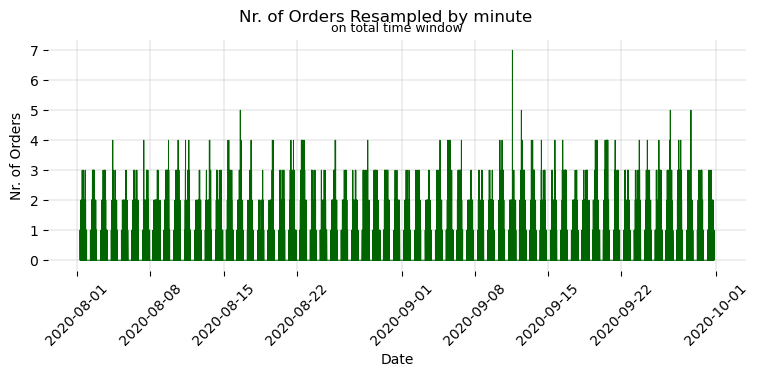

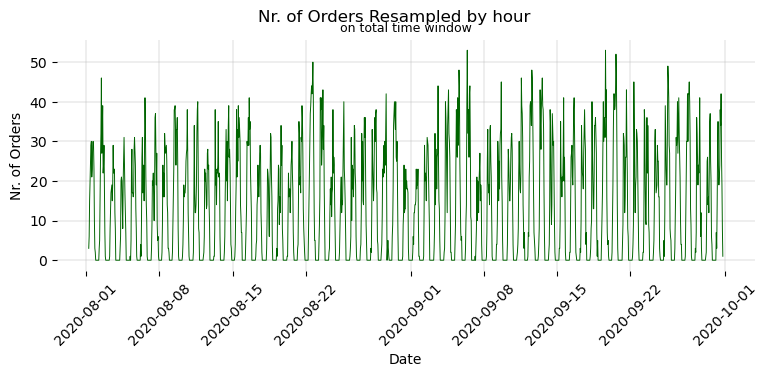

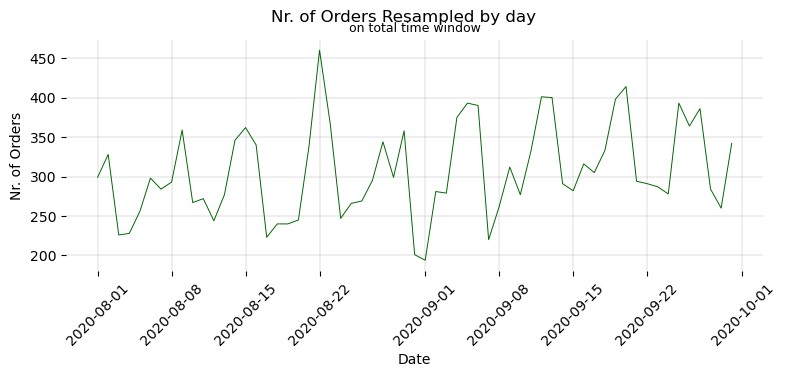

In [302]:
def timeseries_plotter_counts(resampled_by = 'day'):
    dictio = {'minute': 'T','hour': 'H',"day":'D', 'month':'M'}

    # Resample by day and calculate the mean delay for each day
    resampled_df = time_df_n.resample(dictio[resampled_by]).sum()

    plt.figure(figsize = (9,3))
    # Plot the resampled data
    plt.plot(resampled_df.index, resampled_df['Counts'], linewidth = 0.69, color = 'darkgreen')
    plt.xlabel('Date')
    plt.ylabel('Nr. of Orders')
    plt.suptitle(f'Nr. of Orders Resampled by {resampled_by}')
    plt.title('on total time window', fontsize = 9)
    plt.xticks(rotation = 45)
    plt.grid(True, linewidth = 0.3)
    plt.box(False)
    plt.show()
    
timeseries_plotter_counts('minute')
timeseries_plotter_counts('hour')
timeseries_plotter_counts('day')

# ADVANCED EDA

<center> <h2>Interactive Dashboards</h2></center>

---

Links for the dashboards

- [EDA 1](https://public.tableau.com/views/ADVANCEDEDA1/EDA1?:language=en-US&publish=yes&:display_count=n&:origin=viz_share_link)
- [EDA 2](https://public.tableau.com/views/ADVANCEDEDA2/EDA2?:language=en-US&:display_count=n&:origin=viz_share_link)
- [EDA 3](https://public.tableau.com/views/ADVANCEDEDAHeatmap/HeatMap?:language=en-US&:display_count=n&:origin=viz_share_link)

---

---
###### Orders and delays time trends

![EDA1](EDA1.png "First Dashboard")

---
##### Analysis of Delays (Actual - Estimated Delivery Time > 0)
- Exploring **distributions** for **actual and estimated delivery times**, as well as their **difference**.
- The latter appears to have a gaussian distibution with average lower than zero. **Most of the times users don't experience delays**
- Are delays linked to specific venues? How are they impacted by venues popularity or location?

![EDA2](EDA2.png "Second Dashboard")

![EDA3](EDA3.png "Third Dashboard")

# MODEL

---
Some variables are an obvious choice for a **prediction task**. <br/>
For instance, there's no doubt about the benefit and the need of forecasting the number of orders received in a day/hour.



#### Aim
- The EDA showed some interesting trends/patterns but didn't suggest any unexpected target variable. <br/>
- The best way to use our data is to predict a **well defined variable**, the knowledge of which is of obvious **utiliy**.<br/>
- **We thus focus on the average delay** (Actual - Estimated Delivery Minutes).


<center>We try to complete the following <strong>task</strong>:<br/>
    <strong>PREDICT THE AVERAGE DELAY IN THE NEXT DAY/HOUR </strong></center>
    

#### Benefits

This could be helpful for many reasons. For example:
- the company could encourage a **higher number of couriers** in those day/hours <br/>
where more **delays are expected**, countering the latter by properly distributing deliveries.
- the app could **estimate higher delivery times**, in order not to disappoint users.<br/>
In this case users would just be 'conscious' about the longer waiting times.

#### Approach

- After defining our predictive goal, we will **model the time series** considering both **endogenous and exogenous features.** 

---

## SARIMAX
**S**easonal
**A**uto**R**egressive
**I**ntegrated
**M**oving **Average**
with He**x**ogenous features

---

#### !Remember!
The SARIMAX model is defined by the order parameters (p, d, q) for the ARIMA part and (P, D, Q, s) for the SARIMA part:

- **p**: The order of the AutoRegressive (AR) part. It represents the number of lags of the dependent variable to be used as predictors.
- **d**: The degree of differencing. It indicates how many times the data have had past values subtracted to make the series stationary.
- **q**: The order of the Moving Average (MA) part. It signifies the number of lagged forecast errors that should go into the ARIMA model.
- **P**: The order of the seasonal part of the AutoRegressive (AR) model.
- **D**: The degree of seasonal differencing.
- **Q**: The order of the seasonal part of the Moving Average (MA) model.
- **s**: The length of the seasonal cycle.

---

1. We can work with **daily or hourly** delays. We choose **hourly** time series since we have a good number of samples.

2. **We expect periodicity/seasonality**. At least we should observe trends on a **24-hours basis**

3. We can expect delays to be influenced by **hexogenous features**, such as **weather condition** or number of orders.<br/>
-- We rely on **preciptations**  assuming this feature is known in advance when performing the forecast. Weathermen are reliable nowadays :) <br/>
-- We also consider <strong>weekday and hour</strong> of the day as hexogenous features (for example we know orders are not delivered in certain hours: that is additional information that the model may not completely capture in the naked time series).

---

We will find good orders for the model by looking at the Time Series **Autocorrelation** and **Partial Autocorrelation** for different lags.<br/>
The presence of 'high' (outside confidence interval) correlation will suggest the parameters for the SARIMAX model.


---

In [576]:
#import pandas as pd
#import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

resampled_df = time_df_n.resample('H').sum()
#resampled_df = time_df_n.resample('D').mean()

def correloplotter(x):
    # Compute the autocorrelation function (ACF)
    acf_vals = x#acf(x)
    pacf_vals = x#pacf(x)


    # Plot the ACF
    plot_acf(acf_vals, lags=30)
    plt.ylim([-1.3,1.3])
    plt.grid(linewidth = 0.1)
    #plt.xticks(range(0,20))
    plt.box(True)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines['top'].set_visible(False)
    # Set the width of the axes
    plt.gca().spines['left'].set_linewidth(0.31)
    plt.gca().spines['bottom'].set_linewidth(0.31)

    # Plot the PACF
    plot_pacf(pacf_vals, lags =27)
    plt.ylim([-1.3,1.3])
    plt.grid(linewidth = 0.1)
    plt.box(True)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines['top'].set_visible(False)
    # Set the width of the axes
    plt.gca().spines['left'].set_linewidth(0.31)
    plt.gca().spines['bottom'].set_linewidth(0.31)


    plt.show()

C:\Users\diesi\anaconda3\lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



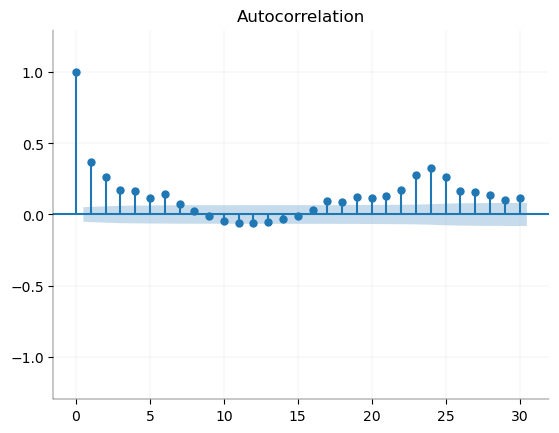

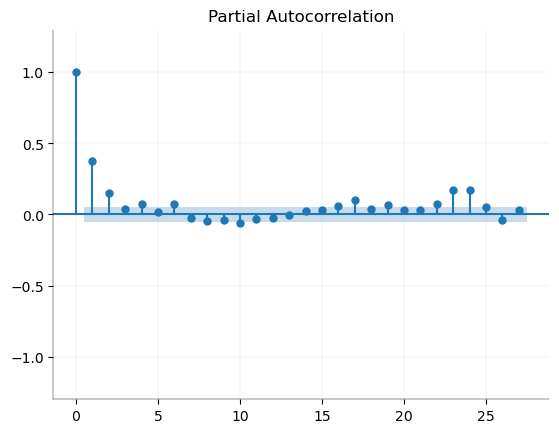

In [577]:
correloplotter(resampled_df['Delay'])

C:\Users\diesi\anaconda3\lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



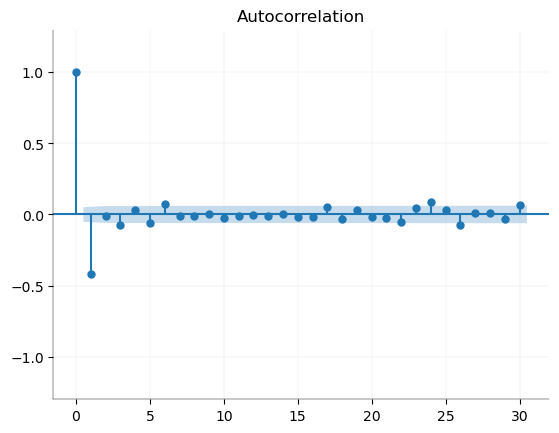

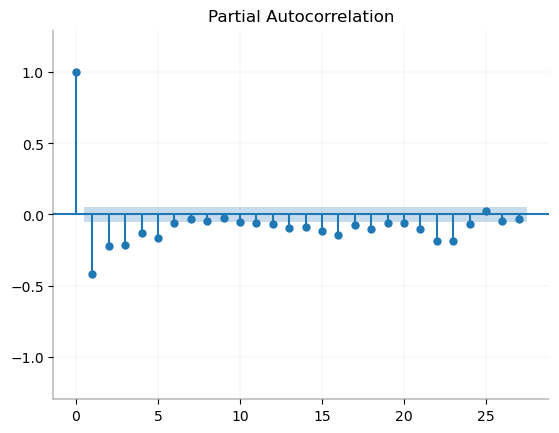

In [578]:
resampled_df['delay_diff'] = resampled_df['Delay'].diff()
resampled_df_dropna = resampled_df.dropna()

correloplotter(resampled_df_dropna['delay_diff'])

#### Sarima

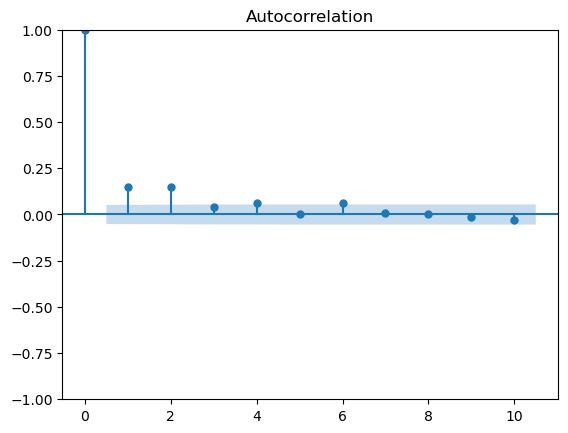

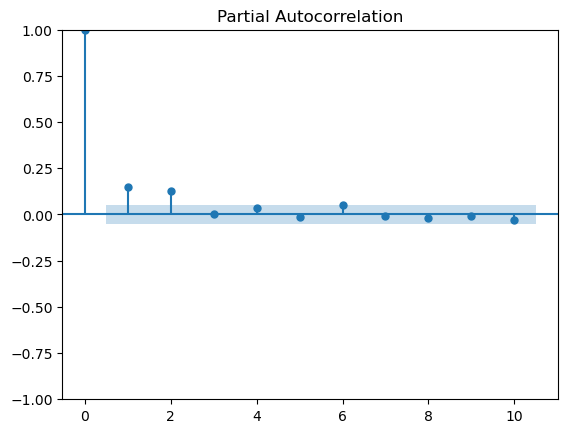

In [537]:
# ACF and PACF plots for seasonal component
seasonal_diff = resampled_df['Delay'].diff(24).dropna()

plot_acf(seasonal_diff, lags=10, zero=True)
plt.show()

plot_pacf(seasonal_diff, lags=10, zero=True)
plt.show()


---

### Analysis
Let's analyze the findings:

###### Original Series:

- ACF shows significant spikes at lags 1, 2, 3, 4, 5, 6, and 16 to 27.
- PACF shows significant spikes at lags 1 and 2.

##### Differencing (non-seasonal):
- ACF after differencing shows significant spikes at lags 1, 6, and 24.
- PACF after differencing shows significant spikes at lags 1, 2, 3, 4, 5, and 16 to 24.

##### Seasonal Differencing (s=24):
- ACF after seasonal differencing shows significant spikes at lags 1 and 2.
- PACF after seasonal differencing shows significant spikes at lags 1 and 2.

### Deductions:

- Considering the ACF and PACF spikes after non-seasonal differencing, it seems there is a seasonal component with a period of 24 hours, as one could expect.

##### Suggested Orders:
Based on the observations, a SARIMA model may be appropriate. The suggested orders could be as follows:

- **Seasonal Order (S)**: 24 (since the data is hourly and the seasonality is observed every 24 hours).
- **Autoregressive Order (p)**: Consider values around 2 for both the non-seasonal and seasonal components based on the PACF.
- **Integrated Order (d)**: 1 for the non-seasonal component (since differencing at lag 1 shows significance).

- **Seasonal Integrated Order (D)**: 1 for the seasonal component (since seasonal differencing at lag 24 shows significance).
- **Moving Average Order (q)**: Consider values around 2 for both the non-seasonal and seasonal components based on the ACF.

---

### Model

---

Dataframe creation. We will have:

- **Target Variable** ->*Average Delay*<br/> Target Variable and time series variable

- **Hex. Features** -> *weekday (number from 1 to 7), hour of the day (1 to 24)*, *Rain (precipitaiotn in mm)*
<br/> We could use categorical features but we retain the numerical form

---

Additional considerations:

- **order** = (2, 1, 2)               
- **seasonal_order** = (2, 1, 2, 24)
- We handle **null values** (for hours where there are no orders at all) by replacing them with the <br/>
average hourly delay across the whole series (*= -1.5*)

---

In [736]:
# Define new dataframe, for convenience
time_df = pd.DataFrame({})
time_df["date"] = data["Datetime"]
time_df["minute"] = data["Datetime"].dt.minute
time_df["hour"] = data["Datetime"].dt.hour
time_df["day"] = data["Datetime"].dt.day
time_df["month"] = data["Datetime"].dt.month
time_df["year"] = data["Datetime"].dt.year
time_df["weekday"] = data["Datetime"].dt.weekday


time_df["Delay"] = data["ACTUAL_DELIVERY_MINUTES - ESTIMATED_DELIVERY_MINUTES"]
time_df["Counts"] = len(time_df)*[1]
time_df["Rain"] = data["PRECIPITATION"]

# This is needed for the resampling in the following plots. Set the "date" column as the index
time_df_n = time_df
time_df_n.set_index('date', inplace=True)

# Resample by considering hourly sum of delays
resampled_df = time_df_n.resample('H').sum()
#resampled_df = time_df_n.resample('D').mean()

#print(resampled_df['Delay'].dropna().mean())

for column in resampled_df.columns:
    if column != 'Counts':
        # Perform the division only when "Counts" is not 0, otherwise set the result to 0
        resampled_df[column] = np.where(
            resampled_df["Counts"] != 0, 
            resampled_df[column] / resampled_df["Counts"], -1.5) # or 0)

In [737]:
train_size = int(len(resampled_df) * 0.9)  # 95% for training, 5% for testing
train, test = resampled_df[:train_size], resampled_df[train_size:]

In [738]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

### HOURLY FORECAST ###
order = (2, 1, 2)  # Non-seasonal component
seasonal_order = (2, 1, 2, 24)  # Seasonal component

''''
### DAILY FORECAST ###
order = (2, 1, 1)  # Non-seasonal component
seasonal_order = (2, 1, 2, 7)  # Seasonal component
'''

'''
order = (3, 1, 3)  # Non-seasonal component
seasonal_order = (2, 1, 2, 24)  # Seasonal component
'''

# Fit the SARIMA model
sarima_model = SARIMAX(train['Delay'],
                       order=order,  exog=train[['hour','weekday','Rain']],
                       seasonal_order=seasonal_order,
                       method_kwargs={'maxiter':1000})
fitted_sarima_model = sarima_model.fit()

# Forecast on the test set
sarima_predictions = fitted_sarima_model.get_forecast(len(test), exog=test[['hour','weekday','Rain']])


C:\Users\diesi\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

C:\Users\diesi\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

C:\Users\diesi\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Root Mean Squared Error (RMSE): 2.9221514974542764


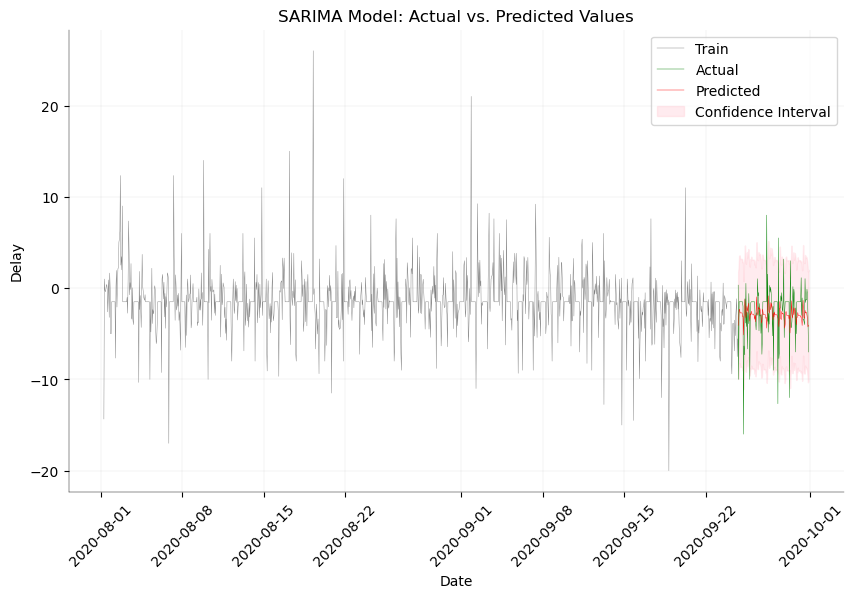

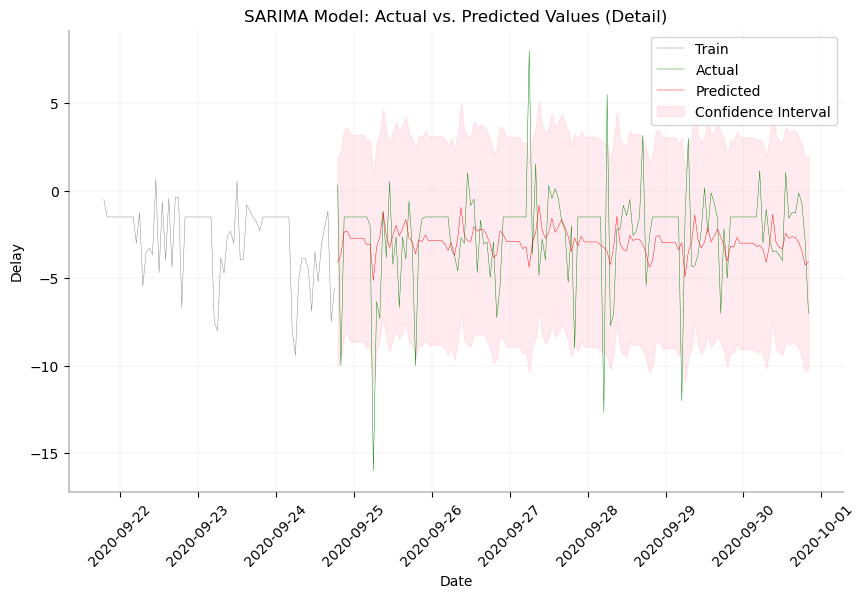

In [767]:
# Calculate RMSE (Root Mean Squared Error)
rmse = sqrt(mean_squared_error(test['Delay'], sarima_predictions.predicted_mean))
print(f'Root Mean Squared Error (RMSE): {rmse}')

# Plotting the results
plt.figure(figsize=(10, 6))

# Plot training data
plt.plot(train.index, train['Delay'], label='Train', color='gray', linewidth = 0.31)

# Plot actual test data
plt.plot(test.index, test['Delay'], label='Actual', color='green', linewidth = 0.31)

# Plot predicted values
plt.plot(test.index, sarima_predictions.predicted_mean, label='Predicted', color='red', linewidth = 0.31)

# Plot confidence intervals
ci = sarima_predictions.conf_int()
plt.fill_between(test.index, ci['lower Delay'], ci['upper Delay'], color='pink', alpha=0.3, label='Confidence Interval')

plt.title('SARIMA Model: Actual vs. Predicted Values')
plt.xlabel('Date')
plt.ylabel('Delay')
plt.xticks(rotation=45)
plt.legend()
plt.box(True)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['top'].set_visible(False)
# Set the width of the axes
plt.gca().spines['left'].set_linewidth(0.31)
plt.gca().spines['bottom'].set_linewidth(0.31)
plt.grid(linewidth = 0.1)
plt.show()

##############
### DETAIL ###
##############

# Plotting the results
plt.figure(figsize=(10, 6))

# Plot training data
plt.plot(train.index[-24*3:], train['Delay'][-24*3:], label='Train', color='gray', linewidth = 0.31)

# Plot actual test data
plt.plot(test.index, test['Delay'], label='Actual', color='green', linewidth = 0.31)

# Plot predicted values
plt.plot(test.index, sarima_predictions.predicted_mean, label='Predicted', color='red', linewidth = 0.31)

# Plot confidence intervals
ci = sarima_predictions.conf_int()
plt.fill_between(test.index, ci['lower Delay'], ci['upper Delay'], color='pink', alpha=0.3, label='Confidence Interval')


plt.title('SARIMA Model: Actual vs. Predicted Values (Detail)')
plt.xlabel('Date')
plt.ylabel('Delay')
plt.xticks(rotation=45)
plt.legend()
plt.box(True)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['top'].set_visible(False)
# Set the width of the axes
plt.gca().spines['left'].set_linewidth(0.31)
plt.gca().spines['bottom'].set_linewidth(0.31)

plt.grid(linewidth = 0.1)
plt.show()

---

### Diagnostic (below)

##### Dsitribution
- No trend observed
- No deviation from gaussian distribution, except for a narrower peak of the KDE.

##### Q-Q Plot:

- The small "s" shape around the diagonal line in the Q-Q plot may indicate slight deviations from normality.<br/>
This is not uncommon at the tails of the distribution.

##### Correlogram:

- No spikes just outside the confidence band in the correlogram 
- The model likely won't benefit from changes in the orders

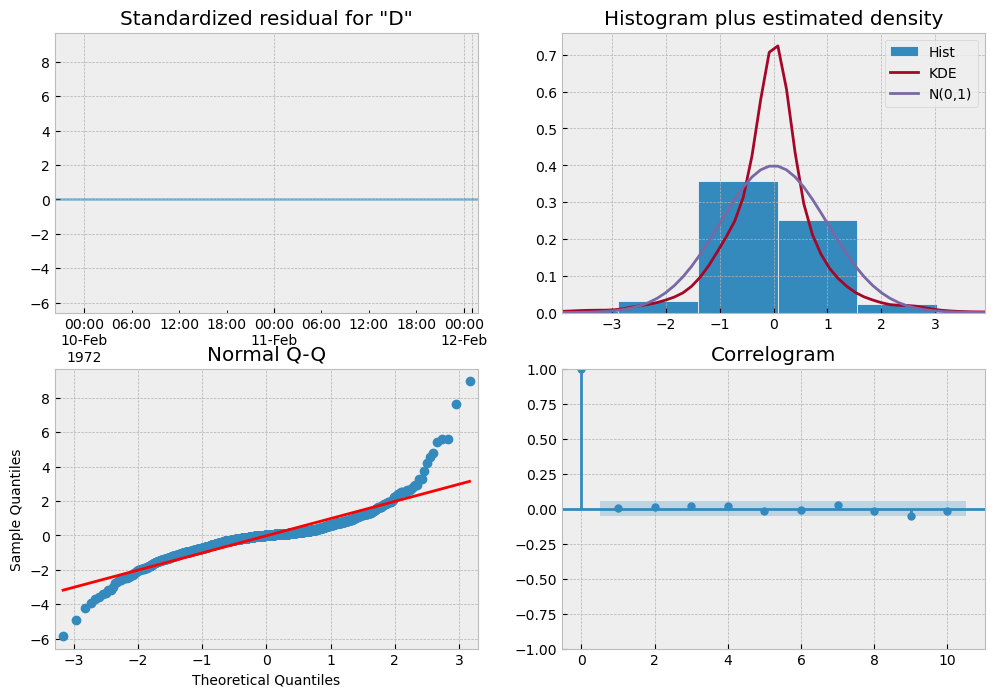

In [819]:
plt.style.use('bmh') #ggplot')
fitted_sarima_model.plot_diagnostics(figsize=(12, 8))
plt.show()
plt.style.use('default')

---

### Results

- The **model captures** global behaviours and **patterns**
- **High values for hourly delay fail to be predicted**, sometimes even trespassing outside of the 95% confidence band. 
- **RMSE** is approx **2.9**

---

## Deep Learning with LSTMs

**L**ong **S**hort **T**erm **M**emory Recurrent Neural Networks

### Model 1 (Vanilla LSTM)

---

**Dataframe creation**. We will have:

- **Target Variable** ->*Average Delay*. Target Variable and time series variable
<br/>


- **Features** 
> 1. *weekday (number from 1 to 7), hour of the day (1 to 24)*, *Rain (precipitaiotn in mm)*
<br/> We could use categorical features but we retain the numerical form
> 2. **Past values of the target variable**, up to a fixed number (LOOKBACK). 
<br/> We **set it to 24** but alternative values should be considered

---

Additional considerations:

- 27 features for one target variable. In addition the lstm will be sensitive to sequential patterns
- We handle **null values** (for hours where there are no orders at all) by replacing them with the <br/>
average hourly delay across the whole series (*= -1.5*)

---

In [773]:
import tensorflow.keras as keras
from tensorflow.keras.layers import Input, Bidirectional, LSTM, Dense
import tensorflow as tf

from sklearn.metrics import mean_squared_error


In [793]:
# Define new dataframe, for convenience
time_df = pd.DataFrame({})
time_df["date"] = data["Datetime"]
time_df["minute"] = data["Datetime"].dt.minute
time_df["hour"] = data["Datetime"].dt.hour
time_df["day"] = data["Datetime"].dt.day
time_df["month"] = data["Datetime"].dt.month
time_df["year"] = data["Datetime"].dt.year
time_df["weekday"] = data["Datetime"].dt.weekday


time_df["Delay"] = data["ACTUAL_DELIVERY_MINUTES - ESTIMATED_DELIVERY_MINUTES"]
time_df["Counts"] = len(time_df)*[1]
time_df["Rain"] = data["PRECIPITATION"]

# This is needed for the resampling in the following plots. Set the "date" column as the index
time_df_n = time_df
time_df_n.set_index('date', inplace=True)

# Resample by considering hourly sum of delays
resampled_df = time_df_n.resample('H').sum()
#resampled_df = time_df_n.resample('D').mean()

#print(resampled_df['Delay'].dropna().mean())

for column in resampled_df.columns:
    if column != 'Counts':
        # Perform the division only when "Counts" is not 0, otherwise set the result to 0
        resampled_df[column] = np.where(
            resampled_df["Counts"] != 0, 
            resampled_df[column] / resampled_df["Counts"], -1.5) # or 0)

In [794]:
hex_df = resampled_df[['hour','weekday','Rain']]
del_df = resampled_df["Delay"]

In [795]:
# Set the lookback period to 24. This is the number of previous time steps 
# to use as input variables to predict the next time period.
LOOKBACK = 24

# Define a function to wrap the data
def wrap_data(df, lookback):
  # Initialize an empty list to store the dataset
  dataset = []
  
  # Loop over the DataFrame from 'lookback' to the end of the DataFrame
  for index in range(lookback, len(df)+1):
    features = {
        f"col_{i}": float(val) for i, val in enumerate(
          df.iloc[index-lookback:index].values
        )
    }
    
    # Convert the dictionary to a DataFrame and append it to the 'dataset' list
    row = pd.DataFrame.from_dict([features])
    
    # Set the index of the row to be the index of the last period in the lookback window
    row.index = [df.index[index-1]]
    
    # Append the row to the dataset
    dataset.append(row)
  
  # Return a DataFrame obtained by concatenating all the DataFrames in the 'dataset' list
  return pd.concat(dataset, axis=0)


In [796]:
# Obtained features by lagging target variable
dataset = wrap_data(del_df, lookback=LOOKBACK)
# Traget Variable
dataset = dataset.join(del_df.shift(-1))
# Hex. Features
dataset = pd.concat([dataset,hex_df],axis = 1)

In [799]:
dataset = dataset.dropna()

In [800]:
callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=3)

def create_model():
    input_layer = Input(shape=(LOOKBACK + len(hex_df.columns), 1))
    recurrent = Bidirectional(LSTM(100, activation="tanh"))(input_layer)
    output_layer = Dense(1)(recurrent)
    model = keras.models.Model(inputs=input_layer, outputs=output_layer)
    model.compile(
        loss='mse', optimizer=keras.optimizers.Adagrad(),
        metrics=[
            keras.metrics.RootMeanSquaredError(),
            keras.metrics.MeanAbsoluteError()
    ])
    return model

model = create_model()

In [801]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    dataset.drop(columns="Delay"),
    dataset["Delay"],
    shuffle=False, test_size = 0.1)

In [802]:
model.fit(X_train, y_train, epochs=1000, callbacks=[callback])

Epoch 1/1000
41/41 [==============================] - 3s 16ms/step - loss: 10.7438 - root_mean_squared_error: 3.2778 - mean_absolute_error: 2.2524
Epoch 2/1000
41/41 [==============================] - 1s 15ms/step - loss: 9.6810 - root_mean_squared_error: 3.1114 - mean_absolute_error: 1.9822
Epoch 3/1000
41/41 [==============================] - 1s 14ms/step - loss: 9.2782 - root_mean_squared_error: 3.0460 - mean_absolute_error: 1.8392
Epoch 4/1000
41/41 [==============================] - 1s 15ms/step - loss: 9.1602 - root_mean_squared_error: 3.0266 - mean_absolute_error: 1.8040
Epoch 5/1000
41/41 [==============================] - 1s 15ms/step - loss: 9.1281 - root_mean_squared_error: 3.0213 - mean_absolute_error: 1.8053
Epoch 6/1000
41/41 [==============================] - 1s 15ms/step - loss: 9.1179 - root_mean_squared_error: 3.0196 - mean_absolute_error: 1.8082
Epoch 7/1000
41/41 [==============================] - 1s 15ms/step - loss: 9.1098 - root_mean_squared_error: 3.0182 - mean_

41/41 [==============================] - 1s 21ms/step - loss: 8.8866 - root_mean_squared_error: 2.9810 - mean_absolute_error: 1.7475
Epoch 112/1000
41/41 [==============================] - 1s 20ms/step - loss: 8.8841 - root_mean_squared_error: 2.9806 - mean_absolute_error: 1.7494
Epoch 113/1000
41/41 [==============================] - 1s 21ms/step - loss: 8.8829 - root_mean_squared_error: 2.9804 - mean_absolute_error: 1.7473
Epoch 114/1000
41/41 [==============================] - 1s 20ms/step - loss: 8.8829 - root_mean_squared_error: 2.9804 - mean_absolute_error: 1.7415
Epoch 115/1000
41/41 [==============================] - 1s 21ms/step - loss: 8.8819 - root_mean_squared_error: 2.9802 - mean_absolute_error: 1.7408
Epoch 116/1000
41/41 [==============================] - 1s 21ms/step - loss: 8.8809 - root_mean_squared_error: 2.9801 - mean_absolute_error: 1.7429
Epoch 117/1000
41/41 [==============================] - 1s 20ms/step - loss: 8.8796 - root_mean_squared_error: 2.9799 - mean_ab

41/41 [==============================] - 1s 20ms/step - loss: 8.7997 - root_mean_squared_error: 2.9664 - mean_absolute_error: 1.7265
Epoch 222/1000
41/41 [==============================] - 1s 20ms/step - loss: 8.7992 - root_mean_squared_error: 2.9663 - mean_absolute_error: 1.7258
Epoch 223/1000
41/41 [==============================] - 1s 19ms/step - loss: 8.7991 - root_mean_squared_error: 2.9663 - mean_absolute_error: 1.7266
Epoch 224/1000
41/41 [==============================] - 1s 20ms/step - loss: 8.7995 - root_mean_squared_error: 2.9664 - mean_absolute_error: 1.7277
Epoch 225/1000
41/41 [==============================] - 1s 20ms/step - loss: 8.7983 - root_mean_squared_error: 2.9662 - mean_absolute_error: 1.7262
Epoch 226/1000
41/41 [==============================] - 1s 19ms/step - loss: 8.7971 - root_mean_squared_error: 2.9660 - mean_absolute_error: 1.7242
Epoch 227/1000
41/41 [==============================] - 1s 20ms/step - loss: 8.7970 - root_mean_squared_error: 2.9660 - mean_ab

In [825]:
def show_result(y_test, predicted):
    plt.figure(figsize=(10, 6))
    plt.plot(y_train.index, y_train, '-', label="Train",  color='gray', linewidth = 0.31)
    plt.plot(y_test.index, y_test, '-', label="actual", color='green', linewidth = 0.31)
    plt.plot(y_test.index, predicted, '-', label="predicted", color='blue', linewidth = 0.31)

    plt.title('LSTM Model: Actual vs. Predicted Values (Detail)')
    plt.xlabel('Date')
    plt.ylabel('Delay')
    plt.legend()
    plt.xticks(rotation=45)
    plt.box(True)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines['top'].set_visible(False)
    # Set the width of the axes
    plt.gca().spines['left'].set_linewidth(0.31)
    plt.gca().spines['bottom'].set_linewidth(0.31)
    
    plt.grid(linewidth = 0.1)
    plt.show()

def show_result_detail(y_test, predicted):
    # Plotting the results
    plt.figure(figsize=(10, 6))

    # Plot training data
    #plt.plot(X_train.index[-24*3:], train['Delay'][-24*3:], label='Train', color='gray', linewidth = 0.31)

    plt.plot(y_train.index[-24*3:], y_train[-24*3:], '-', label="Train",  color='gray', linewidth = 0.31)
    plt.plot(y_test.index, y_test, '-', label="actual", color='green', linewidth = 0.31)
    plt.plot(y_test.index, predicted, '-', label="predicted", color='blue', linewidth = 0.31)

    # Plot confidence intervals
    #ci = sarima_predictions.conf_int()
    #plt.fill_between(test.index, ci['lower Delay'], ci['upper Delay'], color='pink', alpha=0.3, label='Confidence Interval')


    plt.title('LSTM Model: Actual vs. Predicted Values (Detail)')
    plt.xlabel('Date')
    plt.ylabel('Delay')
    plt.xticks(rotation=45)
    plt.legend()
    plt.box(True)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines['top'].set_visible(False)
    # Set the width of the axes
    plt.gca().spines['left'].set_linewidth(0.31)
    plt.gca().spines['bottom'].set_linewidth(0.31)

    plt.grid(linewidth = 0.1)
    plt.show()
    
    results_df = pd.DataFrame({'test':y_test,'preds':list(predicted)})
    mse = mean_squared_error(results_df.dropna()['test'], results_df.dropna()['preds'])
    rmse = mse**(1/2)
    print(f'Test RMSE: {rmse}')

5/5 [==============================] - 0s 6ms/step


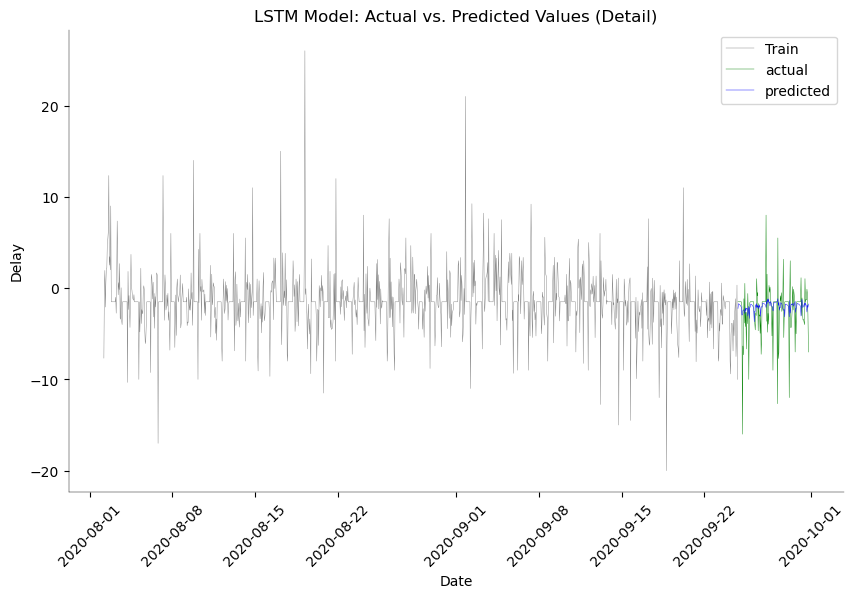

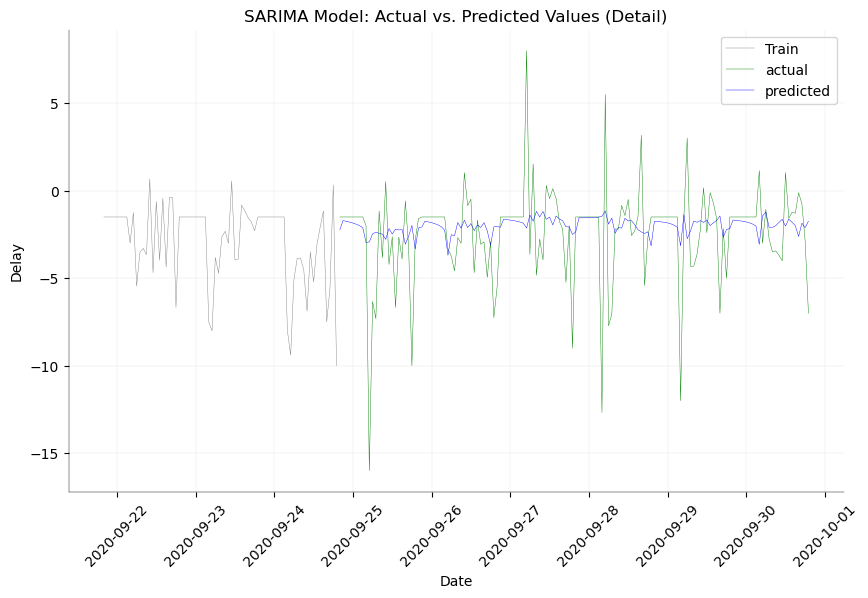

Test RMSE: 2.8147900311469574


In [816]:
predicted = model.predict(X_test)
show_result(y_test, predicted)
show_result_detail(y_test, predicted)

---

### Results

- The **model captures** global behaviours and **patterns**, but not better than SARIMAX.
- **High values for hourly delay fail to be predicted**. The predicted values tend to lay around the mean.
- **RMSE** is approx **2.8**

---

### Further Developements

- Set **different LOOKBACK** values
- **Upgrade LSTM architecture, add layers and parameters** for richer non-linear models.
- Optimize training

---

### Model 2 (Multiple Layers LSTM)

- Adding layers to **Model 1**

In [820]:
def create_complex_model():
    input_layer = Input(shape=(LOOKBACK + len(hex_df.columns), 1))
    
    # Add multiple LSTM layers with dropout
    lstm1 = Bidirectional(LSTM(100, activation="tanh", return_sequences=True))(input_layer)
    lstm1 = Dropout(0.2)(lstm1)
    
    lstm2 = Bidirectional(LSTM(50, activation="tanh", return_sequences=True))(lstm1)
    lstm2 = Dropout(0.2)(lstm2)
    
    lstm3 = Bidirectional(LSTM(25, activation="tanh"))(lstm2)
    lstm3 = Dropout(0.2)(lstm3)
    
    # Concatenate the output of the last LSTM layer with the input for skip connections
    #concat_layer = Concatenate()([lstm3, input_layer])
    
    # Dense layers for final prediction
    dense1 = Dense(50, activation='relu')(lstm3)
    #dense1 = Dense(50, activation='relu')(concat_layer)
    dense1 = Dropout(0.2)(dense1)
    
    dense2 = Dense(25, activation='relu')(dense1)
    dense2 = Dropout(0.2)(dense2)
    
    output_layer = Dense(1)(dense2)
    
    model = keras.models.Model(inputs=input_layer, outputs=output_layer)
    
    model.compile(
        loss='mse',
        optimizer=keras.optimizers.Adam(),
        metrics=[
            keras.metrics.RootMeanSquaredError(),
            keras.metrics.MeanAbsoluteError()
        ]
    )
    
    return model

model.fit(X_train, y_train, epochs=1000, callbacks=[callback])

Epoch 1/1000
41/41 [==============================] - 1s 15ms/step - loss: 8.7798 - root_mean_squared_error: 2.9631 - mean_absolute_error: 1.7224
Epoch 2/1000
41/41 [==============================] - 1s 15ms/step - loss: 8.7784 - root_mean_squared_error: 2.9628 - mean_absolute_error: 1.7238
Epoch 3/1000
41/41 [==============================] - 1s 15ms/step - loss: 8.7787 - root_mean_squared_error: 2.9629 - mean_absolute_error: 1.7257
Epoch 4/1000
41/41 [==============================] - 1s 15ms/step - loss: 8.7776 - root_mean_squared_error: 2.9627 - mean_absolute_error: 1.7268
Epoch 5/1000
41/41 [==============================] - 1s 16ms/step - loss: 8.7783 - root_mean_squared_error: 2.9628 - mean_absolute_error: 1.7249
Epoch 6/1000
41/41 [==============================] - 1s 15ms/step - loss: 8.7778 - root_mean_squared_error: 2.9627 - mean_absolute_error: 1.7271
Epoch 7/1000
41/41 [==============================] - 1s 14ms/step - loss: 8.7757 - root_mean_squared_error: 2.9624 - mean_a

41/41 [==============================] - 1s 20ms/step - loss: 8.7262 - root_mean_squared_error: 2.9540 - mean_absolute_error: 1.7167
Epoch 112/1000
41/41 [==============================] - 1s 20ms/step - loss: 8.7256 - root_mean_squared_error: 2.9539 - mean_absolute_error: 1.7181
Epoch 113/1000
41/41 [==============================] - 1s 20ms/step - loss: 8.7244 - root_mean_squared_error: 2.9537 - mean_absolute_error: 1.7174
Epoch 114/1000
41/41 [==============================] - 1s 20ms/step - loss: 8.7239 - root_mean_squared_error: 2.9536 - mean_absolute_error: 1.7184
Epoch 115/1000
41/41 [==============================] - 1s 20ms/step - loss: 8.7245 - root_mean_squared_error: 2.9537 - mean_absolute_error: 1.7192
Epoch 116/1000
41/41 [==============================] - 1s 20ms/step - loss: 8.7236 - root_mean_squared_error: 2.9536 - mean_absolute_error: 1.7180
Epoch 117/1000
41/41 [==============================] - 1s 20ms/step - loss: 8.7236 - root_mean_squared_error: 2.9536 - mean_ab

5/5 [==============================] - 0s 9ms/step


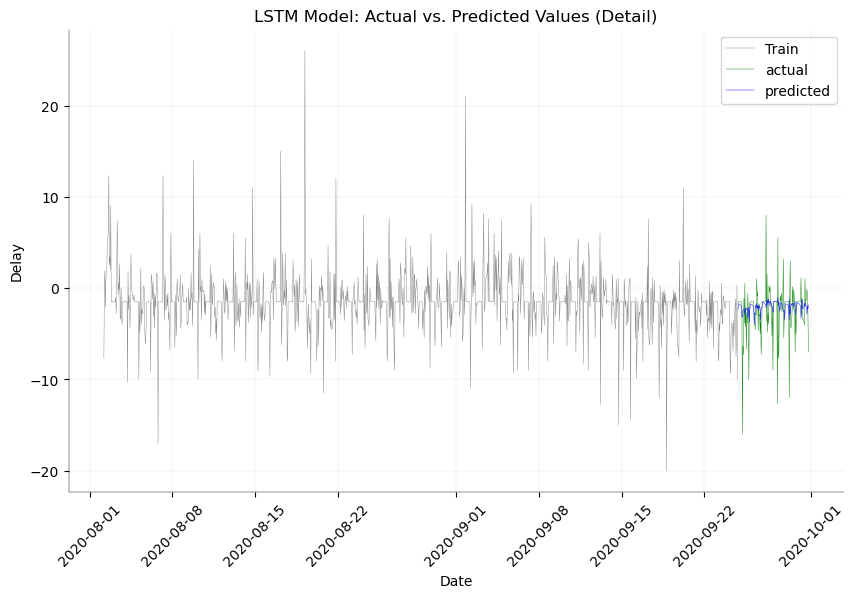

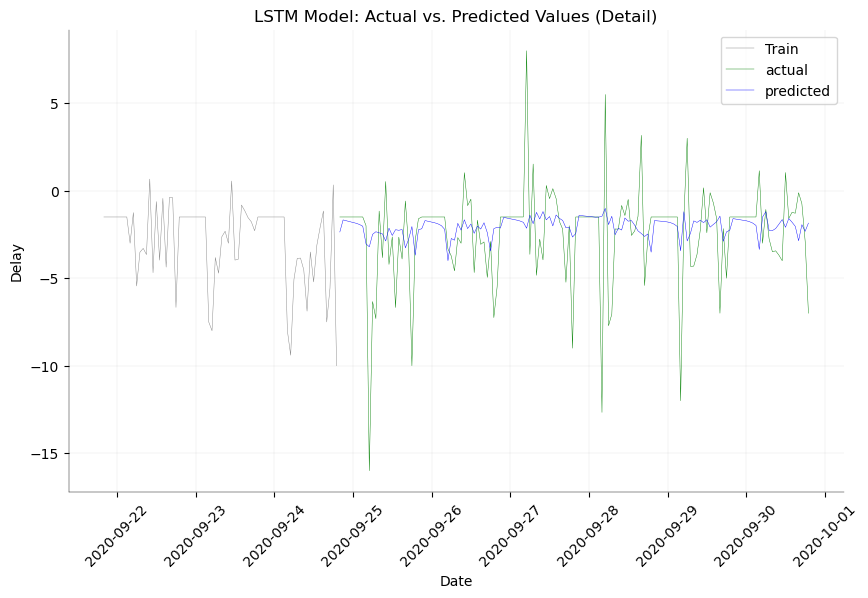

Test RMSE: 2.797925942229235


In [826]:
predicted = model.predict(X_test)
show_result(y_test, predicted)
show_result_detail(y_test, predicted)

---

### Results

- The **model captures** global behaviours and **patterns**, but not better than SARIMAX.
- **High values for hourly delay fail to be predicted**. The predicted values tend to lay around the mean.
- **RMSE** is approx **2.8**

---

### Further Developements

- Set **different LOOKBACK** values
- **Upgrade LSTM architecture, add layers and parameters** for richer non-linear models.
- Optimize training

---

# CONCLUSIONS AND FURTHER DEVELOPMENTS
 
- **Forecasting daily delays** rather than hourly ones would be reasonable, and **likely yield better results**.<br/>
**More data is needed** in order to do that.
- SARIMAX and LSTM models should be **optimized** by **tuning parameters** and modifying **architectures**.
- **Anomaly detection** could be employed to predict **spikes in the delivery time**.
- **More advanced models** should be considered. LSTMs could be replaced by **Transformers**.